<a href="https://colab.research.google.com/github/Shukria21/My-Projects/blob/main/FinalProject_ShukriaGulzar_and_ReneGarcia.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Binary Classfication
**Introduction:**


For this Final project Shukria Gulzar and Rene Garcia decided to  working together to perform binary classification(foul or not foul) in soccer. The original dataset that we downloaded, had over 1200 images. After going through each folder in that dataset named(archived) we found out that each folder had another folder within named "VAR" and under that folder there was two other folder names "Foul" and "clean_tackle" and all the images were combined together in a folder named "var600" so we decided to use that specfic folder as our dataset.

**NOTE:** We didnt went through all 1204 images for classfication, only tried few of them to see if our code works or not. going through all of them takes so much time.


**Project Objective:**
Our objective is to go through each image and classify if an image is foul or not and then print out each images classfication.

**Project Challenges:**

Our issue was first we had an issue with loading the dataset, because no matter what we did it wont load any images. so we decided to download the dataset directly from kaggle.
another issue was that for some images the classfication is wrong. Its so hard to figure it out whats the issue is because the data being loaded correctly and it also already trained.

**Note:** The report for our project is also included in this notebook, detailing and describing the outputs of each picture we detect.


**Resources:**
- some of image processing hws (we decided to use this https://colab.research.google.com/drive/1bptC8F8Aomkli9f4ggZOdMa4IQ4WgbuI)
      

https://colab.research.google.com/drive/1VDfOIWrkTgpOURg6fEx57XRy2zOWbK0n?usp=sharing

https://www.geeksforgeeks.org/how-to-iterate-through-images-in-a-folder-python/

https://aamir07.medium.com/var-cnn-football-foul-or-clean-tackle-4ff6629c83db

https://chatgpt.com/

**dataset citation:**

https://www.kaggle.com/datasets/zaikali/football-tackles

Since we had a hard time with reading our dataset, we use Kaggle to downaload and read our dataset this way.
in the code below we:
- installed kaggle: this will be allowing us to interact with Kaggle datasets
- then we imported userdata from google colab as we need this when we setting kaggle username and API key from userdata module.
- then we download the dataset and unzip it.

In [ ]:
!pip install -q kaggle

from google.colab import userdata
import os

os.environ["KAGGLE_USERNAME"] = userdata.get('KAGGLE_USERNAME') #setting kaggle username
os.environ["KAGGLE_KEY"] = userdata.get('KAGGLE_KEY')#setting the Kaggle API key

!mkdir my_dataset #creating directory
!kaggle datasets download -d zaikali/football-tackles # downloading the dataset
!unzip -q football-tackles.zip -d my_dataset # unzip the dataset

Dataset URL: https://www.kaggle.com/datasets/zaikali/football-tackles
License(s): DbCL-1.0
100% 246M/246M [00:09<00:00, 32.4MB/s]
100% 246M/246M [00:09<00:00, 28.1MB/s]


In the code below:

- imported importent libraries
- used the load_datset function to take the directory path and losy pf categpries
- it goes through or iterates over each category and each image
- using OpenCV, it load the images and convert it to RGB format
- it resize the images (100,100)
- appends 0 to clean_tackles and 1 for foul to another list "lab"
- then using the print_dataset_info function it takes the dataset's training as input and prints image of each set
- load the dataset
- split them
- print the info

In [ ]:
import cv2
import numpy as np
import os
from sklearn.model_selection import train_test_split

def load_dataset(dataset_dir, categories): #this function takes two pram
    img = []#initializes an empy list to store images loaded
    lab = []#initializes an empy list to store lables or categories of an images
    for index, category in enumerate(categories): # iterates over each category
        category_path = os.path.join(dataset_dir, "VAR", category)
        for imagename in os.listdir(category_path):#Iterating through Image Files
            if imagename.endswith(".jpg"):#make sure that it ends with .jpg
                image_path = os.path.join(category_path, imagename)
                image = cv2.imread(image_path)
                if image is not None:
                    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                    image = cv2.resize(image, (100, 100))
                    img.append(image)
                    lab.append(index)  # Append index for Clean_Tackles, Fouls
    return np.array(img), np.array(lab) #return img and lab

#using this function to print out the number of images in the training and testing sets
def print_dataset_info(X_train, X_test, y_train, y_test):
    print("Number of images in training set:", len(X_train))
    print("Number of images in testing set:", len(X_test))

# Specify the directory where the images have been extracted
dataset_dir = "/content/my_dataset/var600"
categories = ["Clean_Tackles", "Fouls"]  # Define the categories corresponding to labels 0 and 1

# Load the dataset
img, lab = load_dataset(dataset_dir, categories)
print("Number of images loaded:", len(img))

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(img, lab, test_size=0.2, random_state=42)

# Print the details of the data split
print("Number of images in training set:", len(X_train))
print("Number of images in testing set:", len(X_test))



Number of images loaded: 1204
Number of images in training set: 963
Number of images in testing set: 241


the code below:
- Import necessary libraries
- reshape the input data
- train the logistic regression
- predicts the labels for the flattened testing image
- compute confusion matrix, precision, recall, F1 score, and ROC AUC  score
- compute the ROC  curve and plots it

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Confusion Matrix:
 [[78 55]
 [48 60]]
Precision: 0.5217391304347826
Recall: 0.5555555555555556
F1 Score: 0.5381165919282512
ROC AUC Score: 0.5710108604845447


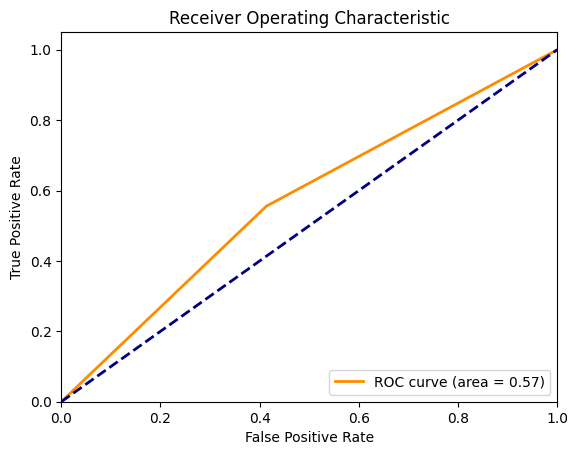

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, roc_curve, roc_auc_score
# Reshape input data to 2D arrays
X_train_flat = X_train.reshape(X_train.shape[0], -1)
X_test_flat = X_test.reshape(X_test.shape[0], -1)

#Training Logistic Regression Model
logreg = LogisticRegression()
logreg.fit(X_train_flat, y_train)

# Flatten images in X_test
X_test_flat = X_test.reshape(X_test.shape[0], -1)

# Predict
y_pred = logreg.predict(X_test_flat)

#Evaluation Metrics
cnf_matrix = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = metrics.roc_auc_score(y_test, y_pred)
print("Confusion Matrix:\n", cnf_matrix)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("ROC AUC Score:", auc)

#operation of roc
fpr, tpr, _ = roc_curve(y_test,  y_pred)
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

the code below:

- imports some necessary libaries
- load the MNIST  dataset
- reshapes and normalizes the input data
- perform one-hot encoding
- creates a sequential model
- add layers
- compile the model
- trian the model
- evaluate the model

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from keras.datasets import mnist
import keras
from keras import layers
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models
from keras.models import Sequential



(X_train, y_train), (X_test, y_test) = mnist.load_data() #Loading MNIST Dataset
#Reshaping and Normalizing Data
X_train = X_train.reshape(X_train.shape[0], 28, 28, 1).astype("float32") / 255
X_test = X_test.reshape(X_test.shape[0], 28, 28, 1).astype("float32") / 255
#One-Hot Encoding Labels
y_train = keras.utils.to_categorical(y_train, 10)
y_test = keras.utils.to_categorical(y_test, 10)

# Defining the model
model = Sequential(
    [
        layers.Conv2D(32, kernel_size=(3, 3), activation="relu", input_shape=(28, 28, 1)),#adds a 2D convolutional layer with 32 filters, each of size 3x3
        layers.MaxPooling2D(pool_size=(2, 2)), #adds a max pooling layer with pool size 2x2
        layers.Conv2D(64, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Flatten(),#flattens the input to a one-dimensional array
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(10, activation="softmax"),
    ]
)

model.summary()
#Compiling the Model
batch_size = 128
epochs = 5
model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

# Train the model
model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.1)

# Evaluate the model
score = model.evaluate(X_test, y_test, verbose=0)
print("Test loss:", score[0])
print("Test accuracy:", score[1])



11490434/11490434 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 11, 11, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 5, 5, 64)          0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 1600)              0         
                                                         

The code below is our goal where it goes through each image and show if the image is classified as foul or not.
Since there is 1204 images, we had to interrupt the run time because it takes a lot of time to go over each images and classify it.

- use classify_imagge function as it takes an image as input
- it converts the image to grayscale by using cv2.cvtColor
- normalize the pixel values
- use the trained model to predict the class of the image
- then iterates through each image
- then it checks if the file ended with .jpg
- read the image
- then it calls the classify_image function for classifying the image
- then it determin if its foul or not
- then it display the image

1/1 [==============================] - 0s 181ms/step


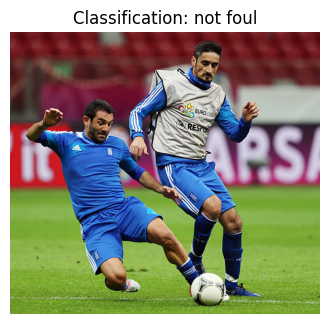

1/1 [==============================] - 0s 17ms/step


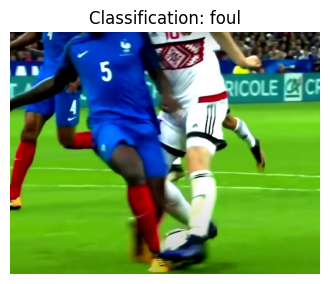

1/1 [==============================] - 0s 17ms/step


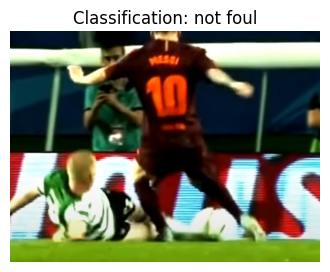

1/1 [==============================] - 0s 18ms/step


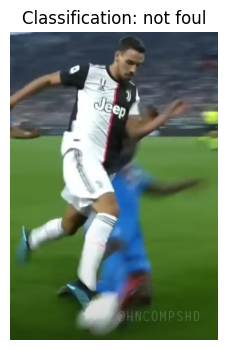

1/1 [==============================] - 0s 28ms/step


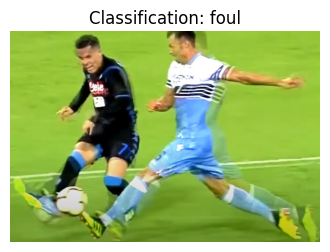

1/1 [==============================] - 0s 17ms/step


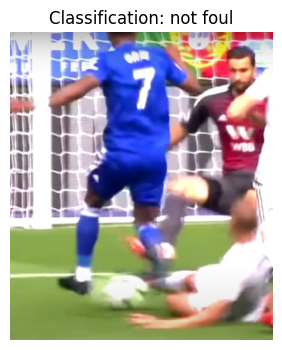

1/1 [==============================] - 0s 17ms/step


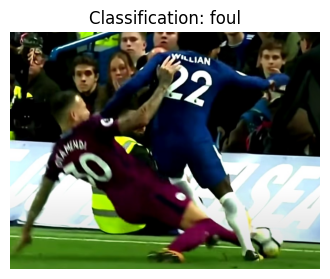

1/1 [==============================] - 0s 17ms/step


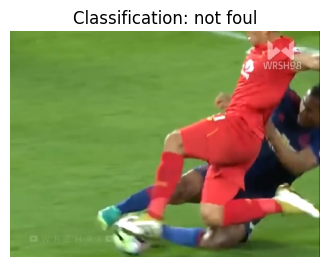

1/1 [==============================] - 0s 26ms/step


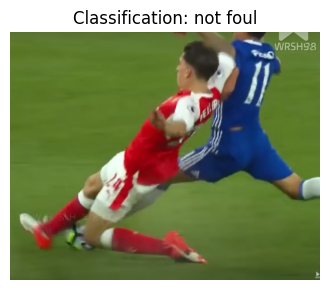

1/1 [==============================] - 0s 17ms/step


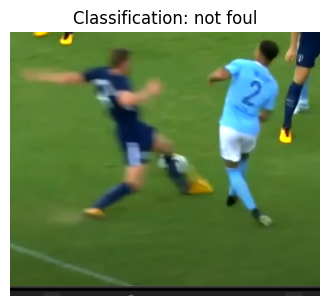

1/1 [==============================] - 0s 17ms/step


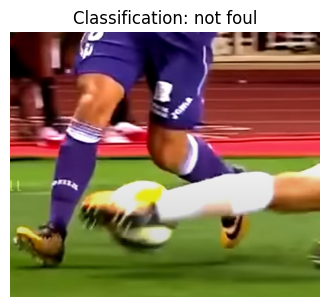

1/1 [==============================] - 0s 27ms/step


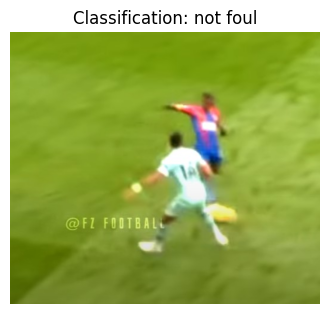

1/1 [==============================] - 0s 17ms/step


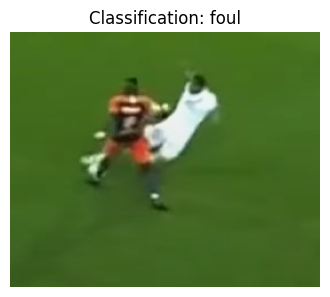

1/1 [==============================] - 0s 28ms/step


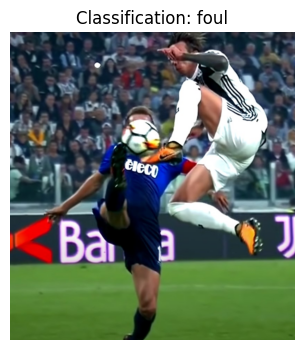

1/1 [==============================] - 0s 38ms/step


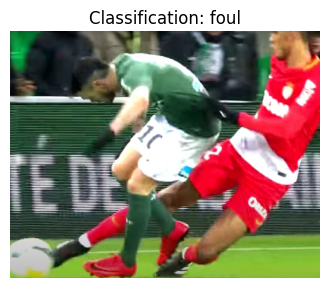

1/1 [==============================] - 0s 31ms/step


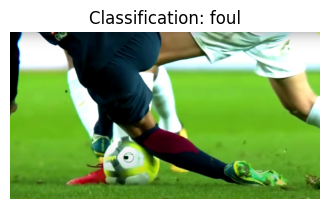

1/1 [==============================] - 0s 28ms/step


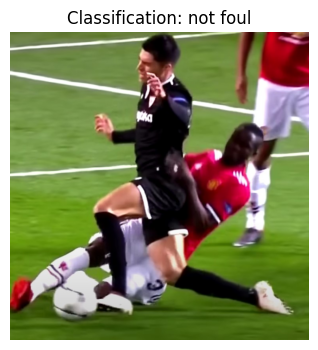

1/1 [==============================] - 0s 37ms/step


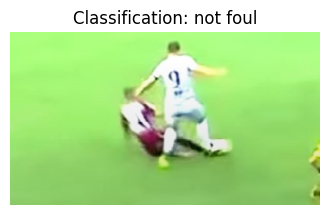

1/1 [==============================] - 0s 29ms/step


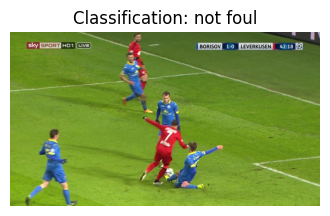

1/1 [==============================] - 0s 26ms/step


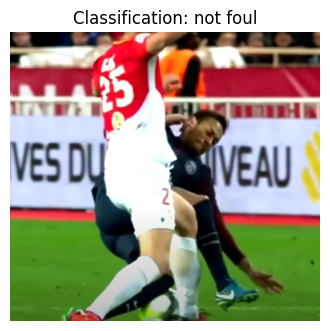

1/1 [==============================] - 0s 29ms/step


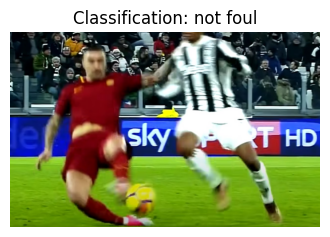

1/1 [==============================] - 0s 34ms/step


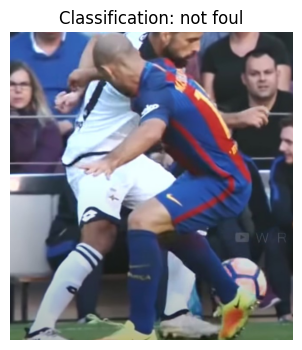

1/1 [==============================] - 0s 28ms/step


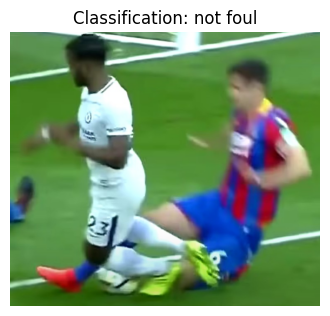

1/1 [==============================] - 0s 34ms/step


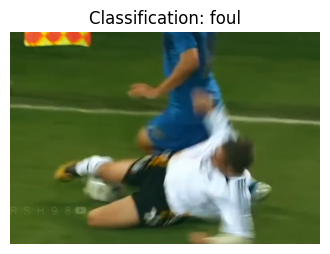

1/1 [==============================] - 0s 19ms/step


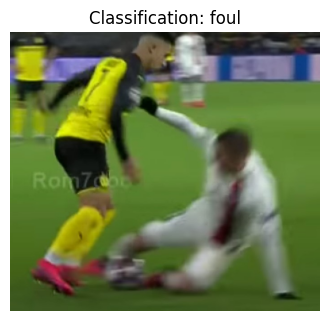

1/1 [==============================] - 0s 19ms/step


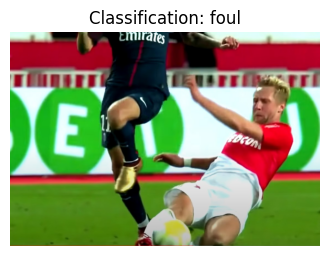

1/1 [==============================] - 0s 36ms/step


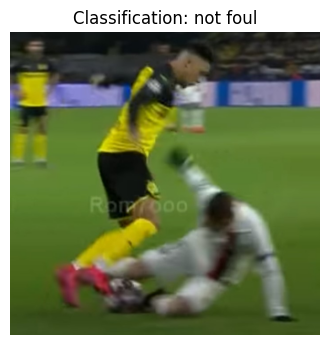

1/1 [==============================] - 0s 24ms/step


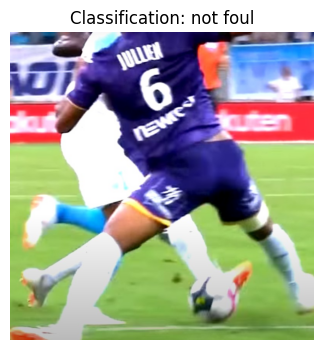

1/1 [==============================] - 0s 26ms/step


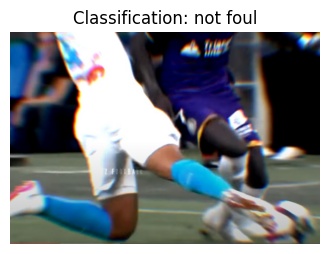

1/1 [==============================] - 0s 29ms/step


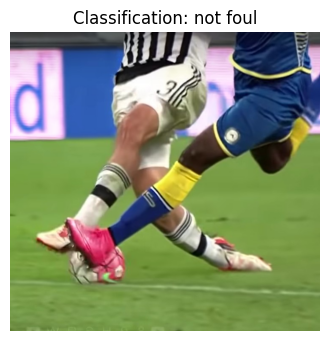

1/1 [==============================] - 0s 24ms/step


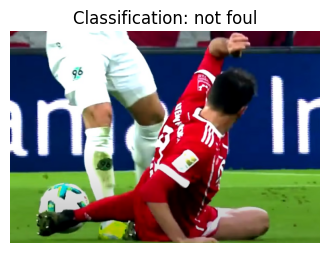

1/1 [==============================] - 0s 23ms/step


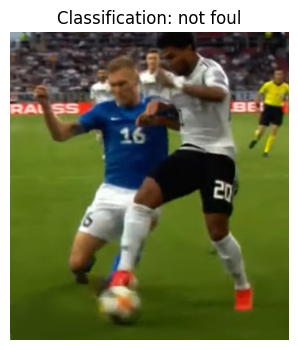

1/1 [==============================] - 0s 41ms/step


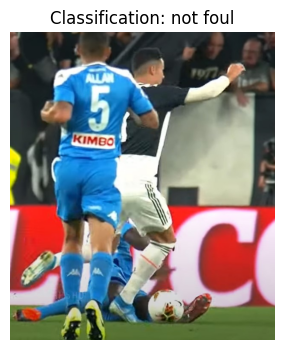

1/1 [==============================] - 0s 24ms/step


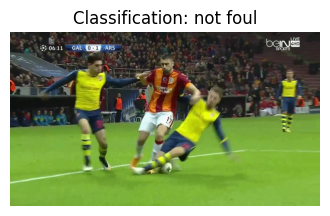

1/1 [==============================] - 0s 26ms/step


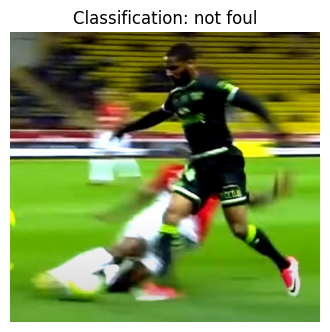

1/1 [==============================] - 0s 29ms/step


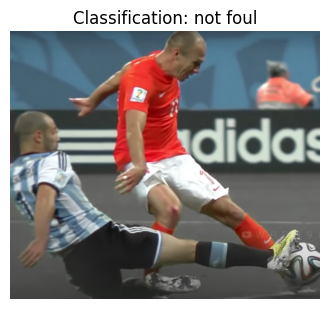

1/1 [==============================] - 0s 25ms/step


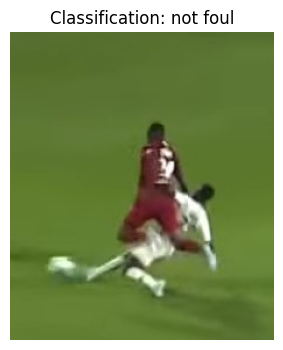

1/1 [==============================] - 0s 28ms/step


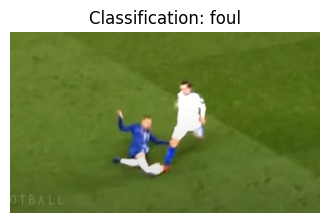

1/1 [==============================] - 0s 25ms/step


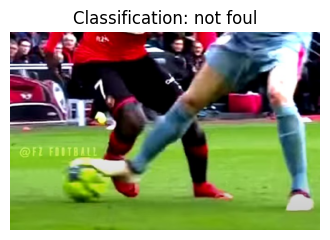

1/1 [==============================] - 0s 26ms/step


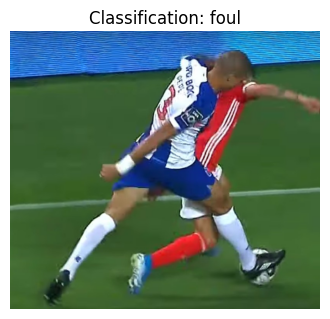

1/1 [==============================] - 0s 27ms/step


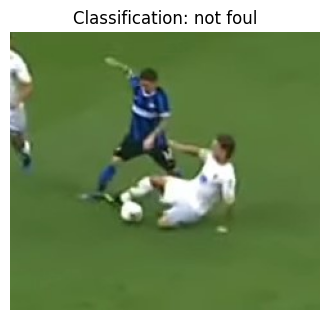

1/1 [==============================] - 0s 36ms/step


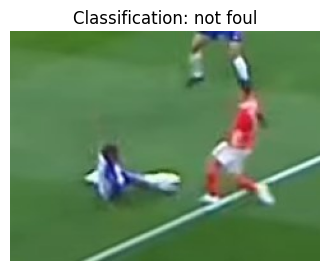

1/1 [==============================] - 0s 22ms/step


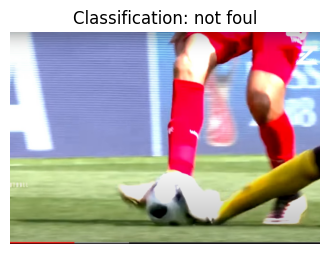

1/1 [==============================] - 0s 25ms/step


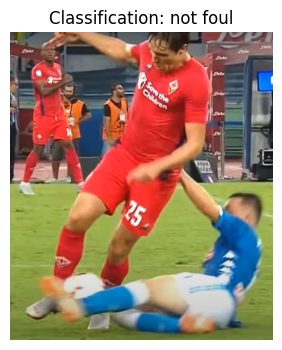

1/1 [==============================] - 0s 27ms/step


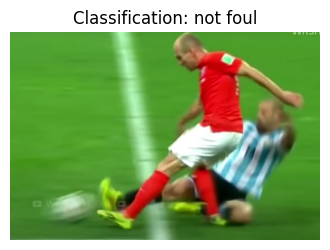

1/1 [==============================] - 0s 27ms/step


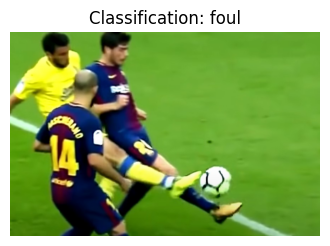

1/1 [==============================] - 0s 26ms/step


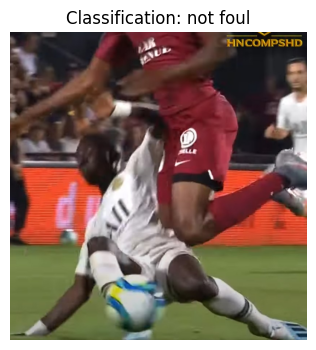

1/1 [==============================] - 0s 26ms/step


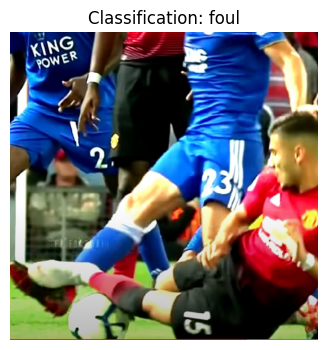

1/1 [==============================] - 0s 36ms/step


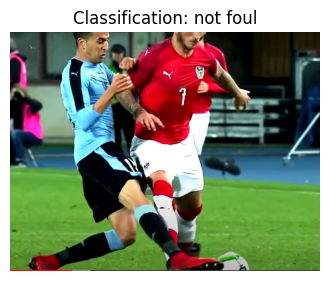

1/1 [==============================] - 0s 24ms/step


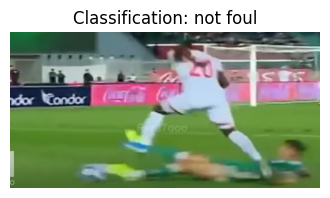

1/1 [==============================] - 0s 28ms/step


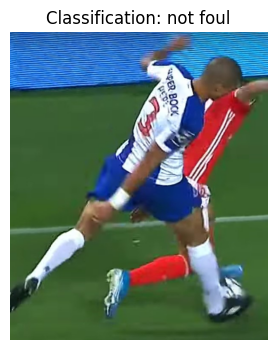

1/1 [==============================] - 0s 29ms/step


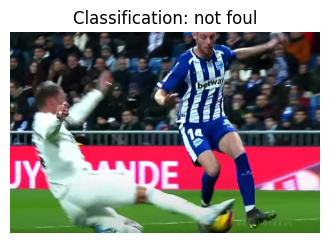

1/1 [==============================] - 0s 27ms/step


KeyboardInterrupt: 

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt


def classify_image(image):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Preprocess the image
    processed_image = cv2.resize(gray_image, (28, 28))  # Resize the image
    processed_image = processed_image / 255.0  # Normalize pixel values
    processed_image = np.expand_dims(processed_image, axis=-1)  # Add a channel dimension
    processed_image = np.expand_dims(processed_image, axis=0)  # Add a batch dimension

    # Predict the class of the image
    prediction = model.predict(processed_image)
    predicted_class = np.argmax(prediction)

    return predicted_class


# Loop through each image in the directory
for root, dirs, files in os.walk(dataset_dir):
    for filename in files:
        if filename.endswith(".jpg"):
            # Read the image
            image_path = os.path.join(root, filename)
            original_image = cv2.imread(image_path)

            # Classify the image
            classification = classify_image(original_image)

            # Determine if it's foul or not foul
            classification_str = "foul" if classification == 1 else "not foul"

            # Display the image with classification using matplotlib
            plt.figure(figsize=(4, 4))
            plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))

            # Set the title based on the classification
            plt.title("Classification: " + classification_str)
            plt.axis('off')
            plt.show()


Since we decide to not go through all images as it was taking too much time and we were not sure if it classify the images correctly, so we decided to add a counter and go through only 10 images.


- use classify_imagge function as it takes an image as input
- it converts the image to grayscale by using cv2.cvtColor
- normalize the pixel values
- use the trained model to predict the class of the image
- then iterates through each image
- then it checks if the file ended with .jpg
- added a counter till it reach 10
- read the image
- then it calls the classify_image function for classifying the image
- then it determin if its foul or not
- then it display the image (only 10 images)

1/1 [==============================] - 0s 17ms/step


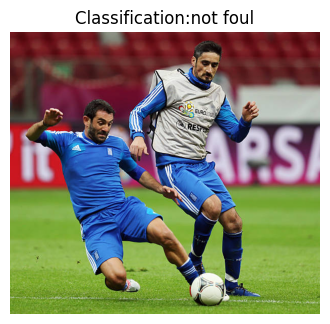

1/1 [==============================] - 0s 17ms/step


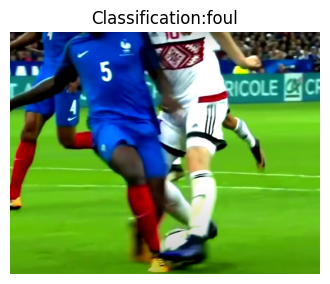

1/1 [==============================] - 0s 17ms/step


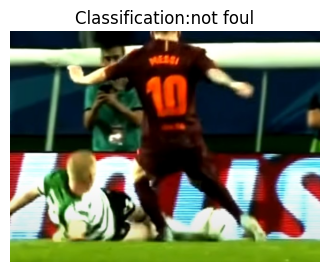

1/1 [==============================] - 0s 22ms/step


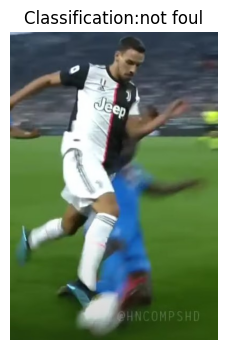

1/1 [==============================] - 0s 17ms/step


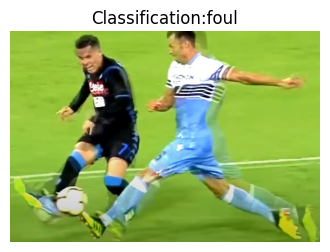

1/1 [==============================] - 0s 30ms/step


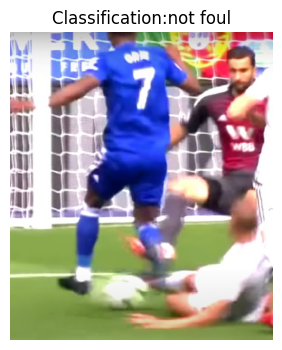

1/1 [==============================] - 0s 27ms/step


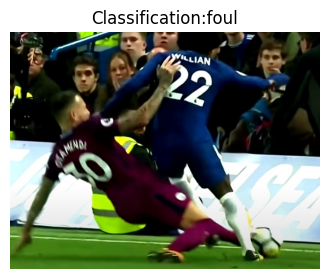

1/1 [==============================] - 0s 17ms/step


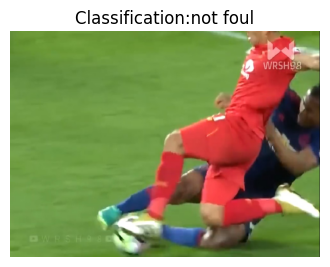

1/1 [==============================] - 0s 21ms/step


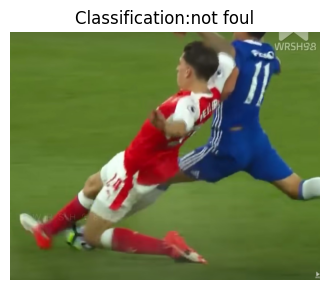

1/1 [==============================] - 0s 17ms/step


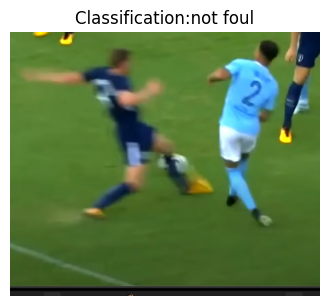

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

def classify_image(image):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Preprocess the image
    processed_image = cv2.resize(gray_image, (28, 28))  # Resize the image
    processed_image = processed_image / 255.0  # Normalize pixel values
    processed_image = np.expand_dims(processed_image, axis=-1)  # Add a channel dimension
    processed_image = np.expand_dims(processed_image, axis=0)  # Add a batch dimension

    # Predict the class of the image
    prediction = model.predict(processed_image)
    predicted_class = np.argmax(prediction)

    # Determine if it's foul or not foul
    classification_str = "foul" if predicted_class == 1 else "not foul"

    return predicted_class, classification_str

# Set a counter to track the number of processed images
processed_image_count = 0

# Loop through each image in the directory
for root, dirs, files in os.walk(dataset_dir):
    for filename in files:
        if filename.endswith(".jpg"):
            # Check if the number of processed images has reached 10
            if processed_image_count >= 10:
                break

            # Increment the counter
            processed_image_count += 1

            # Read the image
            image_path = os.path.join(root, filename)
            original_image = cv2.imread(image_path)

            # Classify the image
            classification, classification_str = classify_image(original_image)


            plt.figure(figsize=(4, 4))
            plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
            plt.title("Classification:"+classification_str)
            plt.axis('off')
            plt.show()



Since we decide to not go through all images as it was taking too much time and we were not sure if it classify the images correctly, so we decided to add a counter and go through only 10 images from the end or last 10 images.


- use classify_imagge function as it takes an image as input
- it converts the image to grayscale by using cv2.cvtColor
- normalize the pixel values
- use the trained model to predict the class of the image
- then iterates through each image
- then it checks if the file ended with .jpg
- added a counter till it reach 10 but only reading the last 10 images
- read the image
- then it calls the classify_image function for classifying the image
- then it determin if its foul or not
- then it display the image (only 10 images)

As the results shows that its nost classfying the images correctly

1/1 [==============================] - 0s 18ms/step


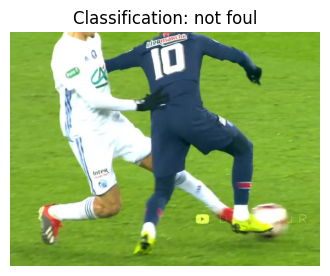

1/1 [==============================] - 0s 17ms/step


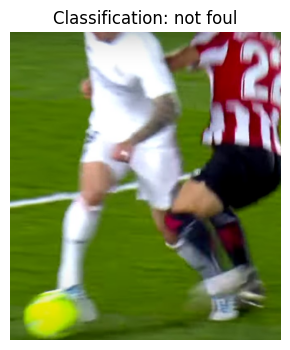

1/1 [==============================] - 0s 17ms/step


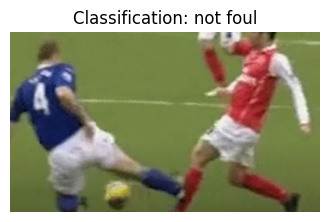

1/1 [==============================] - 0s 18ms/step


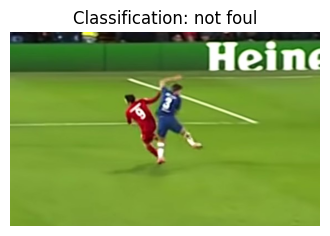

1/1 [==============================] - 0s 18ms/step


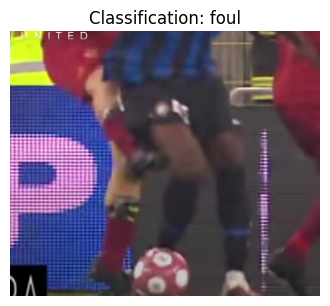

1/1 [==============================] - 0s 35ms/step


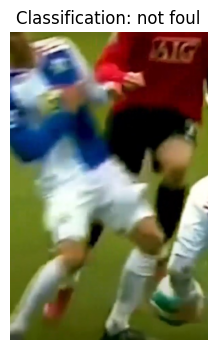

1/1 [==============================] - 0s 30ms/step


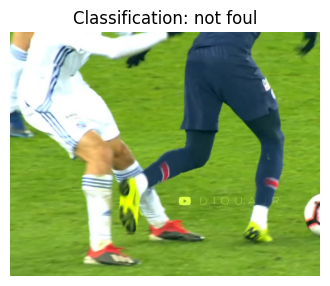

1/1 [==============================] - 0s 19ms/step


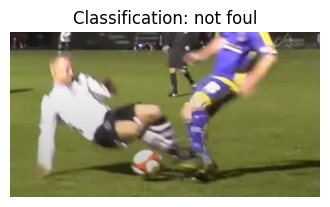

1/1 [==============================] - 0s 17ms/step


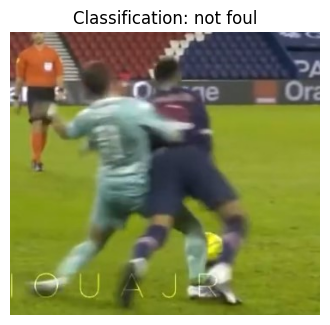

1/1 [==============================] - 0s 21ms/step


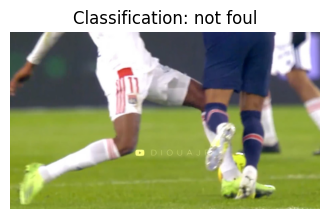

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

def classify_image(image):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Preprocess the image
    processed_image = cv2.resize(gray_image, (28, 28))  # Resize the image
    processed_image = processed_image / 255.0  # Normalize pixel values
    processed_image = np.expand_dims(processed_image, axis=-1)  # Add a channel dimension
    processed_image = np.expand_dims(processed_image, axis=0)  # Add a batch dimension

    # Predict the class
    prediction = model.predict(processed_image)
    predicted_class = np.argmax(prediction)

    # Determine if it's foul or not foul
    classification_str = "foul" if predicted_class == 1 else "not foul"

    return predicted_class, classification_str

# Set a counter
processed_image_count = 0
image_paths = []

# Loop through each image in the directory
for root, dirs, files in os.walk(dataset_dir):
    for filename in files:
        if filename.endswith(".jpg"):
            image_paths.append(os.path.join(root, filename))

# Process only the last 10 images
for image_path in image_paths[-10:]:

    original_image = cv2.imread(image_path)

    # Classify the image
    classification, classification_str = classify_image(original_image)

    # Display
    plt.figure(figsize=(4, 4))
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title("Classification: " + classification_str)
    plt.axis('off')
    plt.show()



then we decide to only read 10 images in the middle

- use classify_imagge function as it takes an image as input
- it converts the image to grayscale by using cv2.cvtColor
- normalize the pixel values
- use the trained model to predict the class of the image
- then iterates through each image
- then it checks if the file ended with .jpg

- set a counter
- Calculate the index range for the middle 10 images
- process the middle 10 images
- read the image
- classify the image
- then print out the image with its classifiction


1/1 [==============================] - 0s 17ms/step


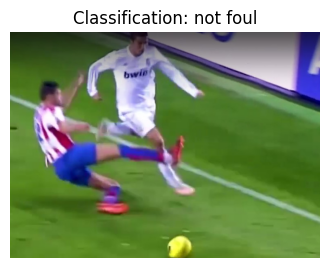

1/1 [==============================] - 0s 17ms/step


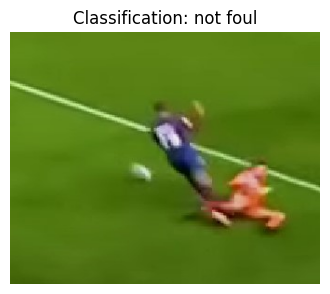

1/1 [==============================] - 0s 17ms/step


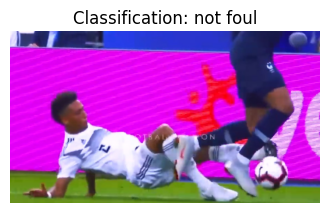

1/1 [==============================] - 0s 17ms/step


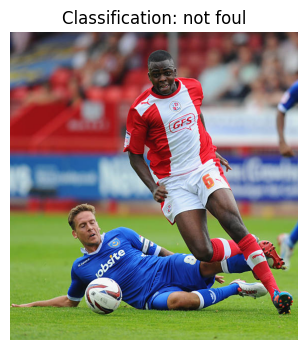

1/1 [==============================] - 0s 17ms/step


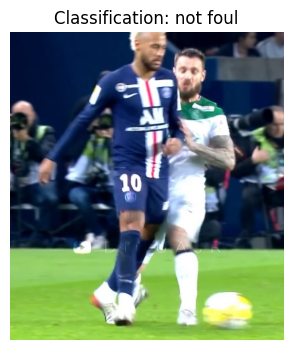

1/1 [==============================] - 0s 17ms/step


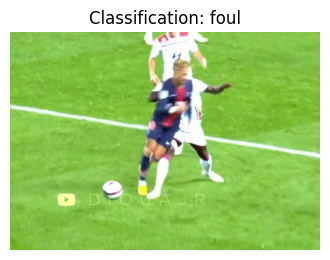

1/1 [==============================] - 0s 16ms/step


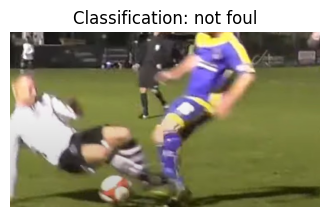

1/1 [==============================] - 0s 18ms/step


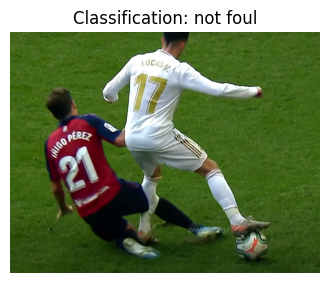

1/1 [==============================] - 0s 17ms/step


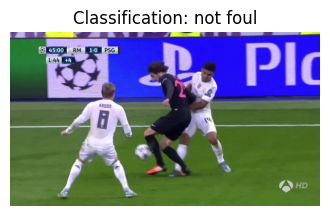

1/1 [==============================] - 0s 18ms/step


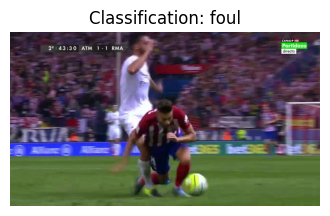

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

def classify_image(image):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Preprocess the image
    processed_image = cv2.resize(gray_image, (28, 28))  # Resize the image
    processed_image = processed_image / 255.0  # Normalize pixel values
    processed_image = np.expand_dims(processed_image, axis=-1)  # Add a channel dimension
    processed_image = np.expand_dims(processed_image, axis=0)  # Add a batch dimension

    # Predict the class of the image using your model
    prediction = model.predict(processed_image)
    predicted_class = np.argmax(prediction)

    # Determine if it's foul or not foul
    classification_str = "foul" if predicted_class == 1 else "not foul"

    return predicted_class, classification_str

# Set a counter to track the number of processed images
processed_image_count = 0
image_paths = []

# Loop through each image in the directory
for root, dirs, files in os.walk(dataset_dir):
    for filename in files:
        if filename.endswith(".jpg"):
            image_paths.append(os.path.join(root, filename))

# Calculate the index range for the middle 10 images
start_index = max(0, len(image_paths) // 2 - 5)  # Start index for the middle 10 images
end_index = min(len(image_paths), start_index + 10)  # End index for the middle 10 images

# Process the middle 10 images
for image_path in image_paths[start_index:end_index]:
    # Read the image
    original_image = cv2.imread(image_path)

    # Classify the image
    classification, classification_str = classify_image(original_image)

    # Display
    plt.figure(figsize=(4, 4))
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title("Classification: " + classification_str)
    plt.axis('off')
    plt.show()

